# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [169]:
# run this once to unzip the file
# ! yes | unzip processed-celeba-small.zip

In [170]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import random
import torch
from PIL import Image

from torch.utils.data import DataLoader, Dataset
import torchvision
from torchvision import transforms as T
from torch.utils.tensorboard import SummaryWriter

import tests

ERROR! Session/line number was not unique in database. History logging moved to new session 5


In [171]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [172]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [
        T.Resize(size),
        T.ToTensor(),
        T.Normalize(mean=[.5, .5, .5], std=[.5, .5, .5]),
    ]
    
    return T.Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [ ]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.transforms = transforms
        self.img_files = glob(directory + '*' + extension)

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.img_files)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        image = Image.open(self.img_files[index])
        tensor = self.transforms(image) 
        return tensor

KeyboardInterrupt: 

In [ ]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

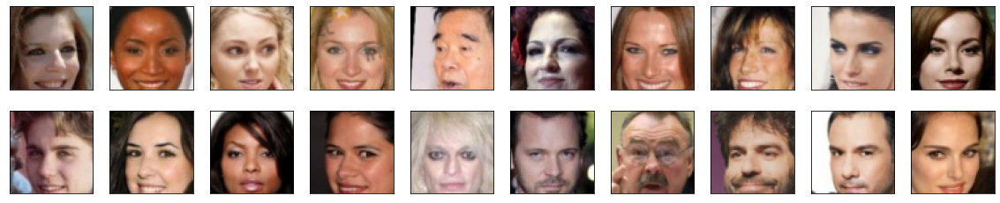

In [ ]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [ ]:
from torch.nn import Module
from torch import nn

In [ ]:
class ConvBlock(nn.Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        ####
        # IMPLEMENT HERE
        ####
        self.batch_norm = batch_norm
        if batch_norm:
            self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
            self.bn = nn.BatchNorm2d(out_channels)
        else:
            self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=True)
            
        self.activation = nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        ####
        # IMPLEMENT HERE
        ####
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x
        

class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        conv_dim = 32
        self.cb1 = ConvBlock(3, conv_dim, 4, False)  # (3, 64, 64) -> (32, 32, 32)
        self.cb2 = ConvBlock(conv_dim, 2 * conv_dim, 4, True)  # (32, 32, 32) -> (64, 16, 16)
        self.cb3 = ConvBlock(2 * conv_dim, 4 * conv_dim, 4, True)  # (64, 16, 16) -> (128, 8, 8)
        self.cb4 = ConvBlock(4 * conv_dim, 8 * conv_dim, 4, True)  # (128, 8, 8) -> (256, 4, 4)
        self.cb5 = ConvBlock(8 * conv_dim, 16 * conv_dim, 4, True)  # (256, 4, 4) -> (512, 2, 2)
        self.cb6 = ConvBlock(16 * conv_dim, 1, 4, False)  # (512, 2, 2) -> (1, 1, 1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.cb1(x)
        x = self.cb2(x)
        x = self.cb3(x)
        x = self.cb4(x)
        x = self.cb5(x)
        x = self.cb6(x)
        return x

In [ ]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


In [ ]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, 
                 in_channels: int, 
                 out_channels: int, 
                 kernel_size: int, 
                 stride: int,
                 padding: int,
                 batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        ####
        # IMPLEMENT HERE
        ####
        self.batch_norm = batch_norm
        
        if batch_norm:
            self.convt = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
            self.bn = nn.BatchNorm2d(out_channels)
        else:
            self.convt = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=True)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        ####
        # IMPLEMENT HERE
        ####
        x = self.convt(x)
        if self.batch_norm:
            x = self.bn(x)
        x = nn.functional.relu(x)
        return x

class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        conv_dim = 16
        self.deconv1 = DeconvBlock(latent_dim, 8 * conv_dim, 4, 2, 0, True)  # (1, 1) -> (4, 4)
        self.deconv2 = DeconvBlock(8 * conv_dim, 4 * conv_dim, 4, 2, 1, True)  # (4, 4) -> (8, 8)
        self.deconv3 = DeconvBlock(4 * conv_dim, 2 * conv_dim, 4, 2, 1, True)  # (8, 8) -> (16, 16)
        self.deconv4 = DeconvBlock(2 * conv_dim, conv_dim, 4, 2, 1, True)  # (16, 16) -> (32, 32)
        self.deconv5 = nn.ConvTranspose2d(conv_dim, 3, 4, 2, 1)  # (32, 32) -> (64, 64)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.deconv5(x)
        x = torch.tanh(x)
        return x

In [ ]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [ ]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    lr = 2e-4
    beta1 = 0.5
    beta2 = beta1**2

    g_optimizer = torch.optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2))
    d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, beta2))
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [ ]:
# def generator_loss(fake_logits):
#     """ Generator loss, takes the fake scores as inputs. """
#     # TODO: implement the generator loss 
#     smooth = False
#     batch_size = fake_logits.size(0)
#     # label smoothing
#     if smooth:
#         # smooth, real labels = 0.9
#         labels = torch.ones(batch_size).cuda() * 0.9
#     else:
#         labels = torch.ones(batch_size).cuda()  # real labels = 1
#     # binary cross entropy with logits loss
#     criterion = nn.BCEWithLogitsLoss()
#     # calculate loss
#     loss = criterion(fake_logits.squeeze(), labels)
#     return loss

def generator_loss(fake_logits):
    """ Wasserstein generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    fake_loss = -fake_logits.mean()
    return fake_loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [ ]:
# def discriminator_loss(real_logits, fake_logits):
#     """ Discriminator loss, takes the fake and real logits as inputs. """
#     # TODO: implement the discriminator loss
#     # Compute the discriminator loss on real, training images
#     real_loss = generator_loss(real_logits)

#     # Compute the discriminator loss on fake, generated images
#     batch_size = fake_logits.size(0)
#     labels = torch.zeros(batch_size).cuda()  # fake labels = 0
#     criterion = nn.BCEWithLogitsLoss()
#     # calculate loss
#     fake_loss = criterion(fake_logits.squeeze(), labels)
    
#     loss = real_loss + fake_loss
#     return loss


def discriminator_loss(real_logits, fake_logits):
    """Wasserstein discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss
    # Compute the discriminator loss on real, training images
    real_loss = -real_logits.mean()
    fake_loss = fake_logits.mean()
    return real_loss + fake_loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [ ]:
def gradient_penalty(discriminator: nn.Module, real_samples: torch.Tensor, fake_samples: torch.Tensor) -> torch.Tensor:
    """
    Gradient penalty of the WGAN-GP model
    """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    # sample a random point between both distributions
    alpha = torch.rand(real_samples.shape).cuda()
    x_hat = alpha * real_samples + (1 - alpha) * fake_samples

    # calculate the gradient
    # x_hat.requires_grad = True
    pred = discriminator(x_hat)
    grad = torch.autograd.grad(pred, x_hat, grad_outputs=torch.ones_like(pred), create_graph=True)[0]

    # calculate the norm and the final penalty
    norm = torch.norm(grad.view(-1), 2)
    gp = ((norm - 1)**2).mean()
    
    return gp

def gradient_penalty_dragan(discriminator: nn.Module, real_sample: torch.Tensor) -> torch.Tensor:
    """
    Gradient penalty of the DRAGAN model
    """
    # sample a random point between both distributions
    X_p = real_sample + 0.5 * real_sample.std() * torch.rand_like(real_sample)
    
    alpha = torch.rand(real_sample.shape).cuda()
    x_hat = alpha * real_sample + (1 - alpha) * X_p
    
    # calculate the gradient
    x_hat.requires_grad = True
    pred = discriminator(x_hat)
    grad = torch.autograd.grad(pred, x_hat, grad_outputs=torch.ones_like(pred), create_graph=True)[0]
    
    # calculate the norm and the final penalty
    norm = torch.norm(grad.view(-1), 2)
    gp = ((norm - 1)**2).mean()

    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [ ]:
def generator_step(generator: Generator, discriminator: Discriminator, g_optimizer: torch.optim.Optimizer, 
                   batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()

    # Generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    if torch.cuda.is_available():
        z = z.cuda()
    fake_images = generator(z)

    # Compute the discriminator losses on fake images 
    # using flipped labels!
    D_fake = discriminator(fake_images)
    g_loss = generator_loss(D_fake)

    # perform backprop
    g_loss.backward()
    g_optimizer.step()

    return {'loss': g_loss}


def discriminator_step(discriminator: Discriminator, d_optimizer: torch.optim.Optimizer, 
                       batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()

    # Compute the discriminator results on real images 
    if torch.cuda.is_available():
        real_images = real_images.cuda()
        
    D_real = discriminator(real_images)

    # Generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()

    # move x to GPU, if available
    if torch.cuda.is_available():
        z = z.cuda()
    fake_images = generator(z)

    # Compute the discriminator losses on fake images            
    D_fake = discriminator(fake_images.detach())

    # Compute loss loss and perform backprop
    d_loss = discriminator_loss(D_real, D_fake)
    # gp = gradient_penalty(discriminator, real_images, fake_images)
    gp = gradient_penalty_dragan(discriminator, real_images)
    
    penalty_coefficient = 10
    loss = d_loss + penalty_coefficient * gp
    loss.backward()
    d_optimizer.step()

    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [ ]:
from datetime import datetime

In [ ]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 50

# number of images in each batch
batch_size = 64

In [ ]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [ ]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

In [ ]:
from scipy import linalg

def get_fid(mu1: np.array, sigma1: np.array, mu2: np.array, sigma2: np.array):
    """
    Calculate the FID. 
    """
    diff = mu1 - mu2
    
    # calculate the square root of the dot product of the covariance matrices
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    
    # calculate the trace
    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1)
            + np.trace(sigma2) - 2 * tr_covmean)

def calculate_fid(images1: torch.Tensor, images2: torch.Tensor):
    """
    Calculates the FID of two sets of images
    """
    if images1.shape[0] >= images2.shape[0]:
        images1 = images1[:images2.shape[0]]
    else:
        images2 = images2[:images1.shape[0]]

    images1 = images1.view(images1.shape[0], -1).detach().cpu().numpy()
    images2 = images2.view(images1.shape[0], -1).detach().cpu().numpy()
    
    mu1, sigma1 = np.mean(images1, axis=0), np.cov(images1)
    mu2, sigma2 = np.mean(images2, axis=0), np.cov(images2)

    fid = get_fid(mu1, sigma1, mu2, sigma2)
    return fid

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-02-12 23:12:51 | Epoch [1/50] | Batch 0/509 | d_loss: 0.0875 | g_loss: -0.1763
2023-02-12 23:12:58 | Epoch [1/50] | Batch 50/509 | d_loss: -0.4045 | g_loss: -2.7859
2023-02-12 23:13:06 | Epoch [1/50] | Batch 100/509 | d_loss: -0.2259 | g_loss: -1.7181
2023-02-12 23:13:14 | Epoch [1/50] | Batch 150/509 | d_loss: 0.1011 | g_loss: -1.3539
2023-02-12 23:13:21 | Epoch [1/50] | Batch 200/509 | d_loss: -0.2656 | g_loss: -1.4175
2023-02-12 23:13:29 | Epoch [1/50] | Batch 250/509 | d_loss: -0.2938 | g_loss: -0.9135
2023-02-12 23:13:36 | Epoch [1/50] | Batch 300/509 | d_loss: -0.0740 | g_loss: -1.0994
2023-02-12 23:13:44 | Epoch [1/50] | Batch 350/509 | d_loss: 0.0271 | g_loss: -1.1787
2023-02-12 23:13:52 | Epoch [1/50] | Batch 400/509 | d_loss: 0.0371 | g_loss: -1.8161
2023-02-12 23:14:00 | Epoch [1/50] | Batch 450/509 | d_loss: 0.1457 | g_loss: -1.3374
2023-02-12 23:14:08 | Epoch [1/50] | Batch 500/509 | d_loss: -0.0398 | g_loss: -1.2215


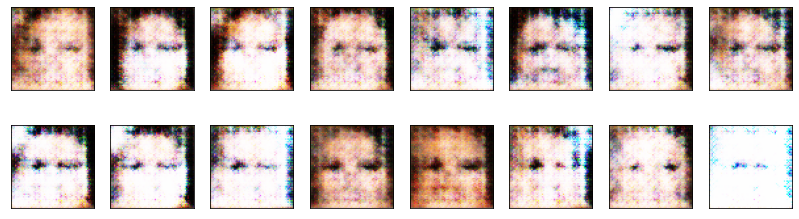

2023-02-12 23:14:10 | Epoch [2/50] | Batch 0/509 | d_loss: 0.0117 | g_loss: -1.1822
2023-02-12 23:14:18 | Epoch [2/50] | Batch 50/509 | d_loss: 0.0493 | g_loss: -1.0266
2023-02-12 23:14:25 | Epoch [2/50] | Batch 100/509 | d_loss: 0.1224 | g_loss: -1.0879
2023-02-12 23:14:33 | Epoch [2/50] | Batch 150/509 | d_loss: -0.0260 | g_loss: -0.8401
2023-02-12 23:14:41 | Epoch [2/50] | Batch 200/509 | d_loss: -0.0096 | g_loss: -0.9131
2023-02-12 23:14:48 | Epoch [2/50] | Batch 250/509 | d_loss: 0.1450 | g_loss: 0.1248
2023-02-12 23:14:56 | Epoch [2/50] | Batch 300/509 | d_loss: 0.0602 | g_loss: 0.4145
2023-02-12 23:15:04 | Epoch [2/50] | Batch 350/509 | d_loss: 0.0580 | g_loss: 0.3652
2023-02-12 23:15:12 | Epoch [2/50] | Batch 400/509 | d_loss: -0.0123 | g_loss: 0.4322
2023-02-12 23:15:19 | Epoch [2/50] | Batch 450/509 | d_loss: -0.0009 | g_loss: 0.3371
2023-02-12 23:15:27 | Epoch [2/50] | Batch 500/509 | d_loss: 0.0551 | g_loss: 0.3790


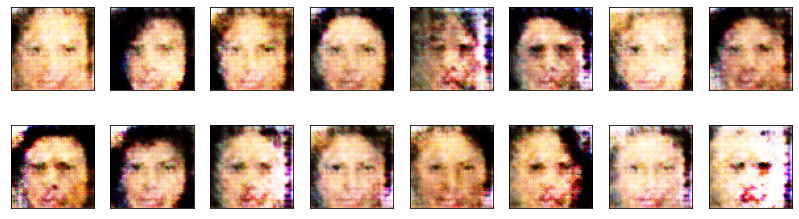

2023-02-12 23:15:29 | Epoch [3/50] | Batch 0/509 | d_loss: 0.0081 | g_loss: 0.2988
2023-02-12 23:15:37 | Epoch [3/50] | Batch 50/509 | d_loss: -0.0077 | g_loss: 0.4703
2023-02-12 23:15:44 | Epoch [3/50] | Batch 100/509 | d_loss: 0.0331 | g_loss: 0.3818
2023-02-12 23:15:52 | Epoch [3/50] | Batch 150/509 | d_loss: 0.0025 | g_loss: 0.4462
2023-02-12 23:16:00 | Epoch [3/50] | Batch 200/509 | d_loss: -0.0208 | g_loss: 0.5704
2023-02-12 23:16:08 | Epoch [3/50] | Batch 250/509 | d_loss: 0.0262 | g_loss: 0.4423
2023-02-12 23:16:15 | Epoch [3/50] | Batch 300/509 | d_loss: -0.0368 | g_loss: 0.6332
2023-02-12 23:16:23 | Epoch [3/50] | Batch 350/509 | d_loss: 0.0552 | g_loss: 0.5510
2023-02-12 23:16:31 | Epoch [3/50] | Batch 400/509 | d_loss: -0.0200 | g_loss: 0.5730
2023-02-12 23:16:39 | Epoch [3/50] | Batch 450/509 | d_loss: 0.0297 | g_loss: 0.5651
2023-02-12 23:16:46 | Epoch [3/50] | Batch 500/509 | d_loss: -0.0387 | g_loss: 0.5967


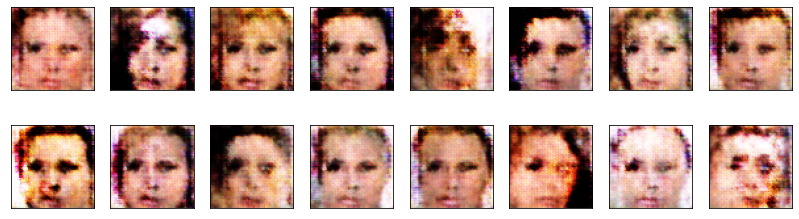

2023-02-12 23:16:49 | Epoch [4/50] | Batch 0/509 | d_loss: -0.0335 | g_loss: 0.5345
2023-02-12 23:16:56 | Epoch [4/50] | Batch 50/509 | d_loss: -0.0165 | g_loss: 0.5594
2023-02-12 23:17:04 | Epoch [4/50] | Batch 100/509 | d_loss: -0.0572 | g_loss: 0.5921
2023-02-12 23:17:12 | Epoch [4/50] | Batch 150/509 | d_loss: 0.0089 | g_loss: 0.5842
2023-02-12 23:17:19 | Epoch [4/50] | Batch 200/509 | d_loss: -0.0159 | g_loss: 0.6474
2023-02-12 23:17:27 | Epoch [4/50] | Batch 250/509 | d_loss: -0.0983 | g_loss: 0.7448
2023-02-12 23:17:35 | Epoch [4/50] | Batch 300/509 | d_loss: -0.0574 | g_loss: 0.5859
2023-02-12 23:17:42 | Epoch [4/50] | Batch 350/509 | d_loss: -0.0855 | g_loss: 0.6425
2023-02-12 23:17:50 | Epoch [4/50] | Batch 400/509 | d_loss: 0.0440 | g_loss: 0.5344
2023-02-12 23:17:58 | Epoch [4/50] | Batch 450/509 | d_loss: -0.0754 | g_loss: 0.5161
2023-02-12 23:18:05 | Epoch [4/50] | Batch 500/509 | d_loss: -0.0470 | g_loss: 0.6381


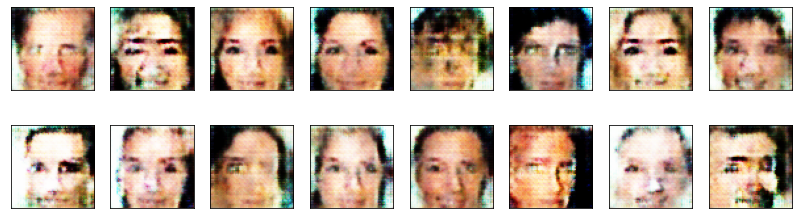

2023-02-12 23:18:07 | Epoch [5/50] | Batch 0/509 | d_loss: -0.0749 | g_loss: 0.6802
2023-02-12 23:18:15 | Epoch [5/50] | Batch 50/509 | d_loss: -0.1065 | g_loss: 0.6373
2023-02-12 23:18:23 | Epoch [5/50] | Batch 100/509 | d_loss: -0.0679 | g_loss: 0.6638
2023-02-12 23:18:31 | Epoch [5/50] | Batch 150/509 | d_loss: -0.0680 | g_loss: 0.6597
2023-02-12 23:18:38 | Epoch [5/50] | Batch 200/509 | d_loss: -0.0019 | g_loss: 0.7137
2023-02-12 23:18:46 | Epoch [5/50] | Batch 250/509 | d_loss: -0.0754 | g_loss: 0.4954
2023-02-12 23:18:54 | Epoch [5/50] | Batch 300/509 | d_loss: -0.1273 | g_loss: 0.8167
2023-02-12 23:19:02 | Epoch [5/50] | Batch 350/509 | d_loss: -0.0863 | g_loss: 0.6962
2023-02-12 23:19:09 | Epoch [5/50] | Batch 400/509 | d_loss: -0.1016 | g_loss: 0.7221
2023-02-12 23:19:17 | Epoch [5/50] | Batch 450/509 | d_loss: -0.0512 | g_loss: 0.5987
2023-02-12 23:19:25 | Epoch [5/50] | Batch 500/509 | d_loss: -0.0500 | g_loss: 0.5667


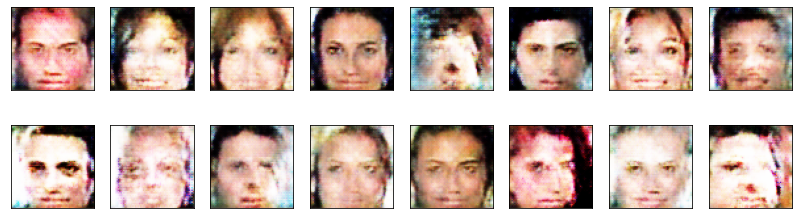

2023-02-12 23:19:27 | Epoch [6/50] | Batch 0/509 | d_loss: -0.0934 | g_loss: 0.5881
2023-02-12 23:19:35 | Epoch [6/50] | Batch 50/509 | d_loss: -0.0699 | g_loss: 0.7646
2023-02-12 23:19:43 | Epoch [6/50] | Batch 100/509 | d_loss: -0.0950 | g_loss: 0.7168
2023-02-12 23:19:50 | Epoch [6/50] | Batch 150/509 | d_loss: -0.0352 | g_loss: 0.5971
2023-02-12 23:19:58 | Epoch [6/50] | Batch 200/509 | d_loss: -0.1305 | g_loss: 0.6327
2023-02-12 23:20:06 | Epoch [6/50] | Batch 250/509 | d_loss: -0.0675 | g_loss: 0.5509
2023-02-12 23:20:13 | Epoch [6/50] | Batch 300/509 | d_loss: -0.0669 | g_loss: 0.6326
2023-02-12 23:20:21 | Epoch [6/50] | Batch 350/509 | d_loss: -0.0394 | g_loss: 0.6256
2023-02-12 23:20:29 | Epoch [6/50] | Batch 400/509 | d_loss: -0.1302 | g_loss: 0.6155
2023-02-12 23:20:36 | Epoch [6/50] | Batch 450/509 | d_loss: -0.0842 | g_loss: 0.6667
2023-02-12 23:20:44 | Epoch [6/50] | Batch 500/509 | d_loss: -0.1141 | g_loss: 0.7578


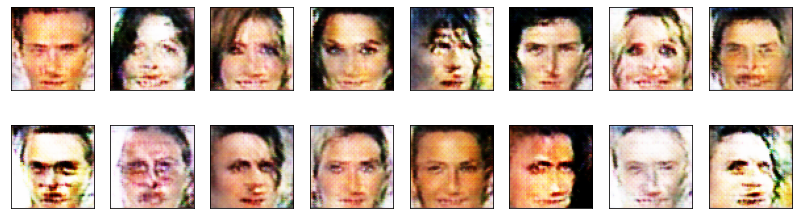

2023-02-12 23:20:46 | Epoch [7/50] | Batch 0/509 | d_loss: -0.0213 | g_loss: 0.7481
2023-02-12 23:20:54 | Epoch [7/50] | Batch 50/509 | d_loss: -0.1075 | g_loss: 0.8246
2023-02-12 23:21:02 | Epoch [7/50] | Batch 100/509 | d_loss: 0.0105 | g_loss: 0.6855
2023-02-12 23:21:09 | Epoch [7/50] | Batch 150/509 | d_loss: -0.0405 | g_loss: 0.6478
2023-02-12 23:21:17 | Epoch [7/50] | Batch 200/509 | d_loss: -0.0384 | g_loss: 0.7474
2023-02-12 23:21:25 | Epoch [7/50] | Batch 250/509 | d_loss: -0.0865 | g_loss: 0.8008
2023-02-12 23:21:32 | Epoch [7/50] | Batch 300/509 | d_loss: -0.0808 | g_loss: 0.6708
2023-02-12 23:21:40 | Epoch [7/50] | Batch 350/509 | d_loss: -0.1178 | g_loss: 0.7644
2023-02-12 23:21:48 | Epoch [7/50] | Batch 400/509 | d_loss: -0.0068 | g_loss: 0.6828
2023-02-12 23:21:56 | Epoch [7/50] | Batch 450/509 | d_loss: -0.0686 | g_loss: 0.7040
2023-02-12 23:22:03 | Epoch [7/50] | Batch 500/509 | d_loss: -0.0442 | g_loss: 0.8167


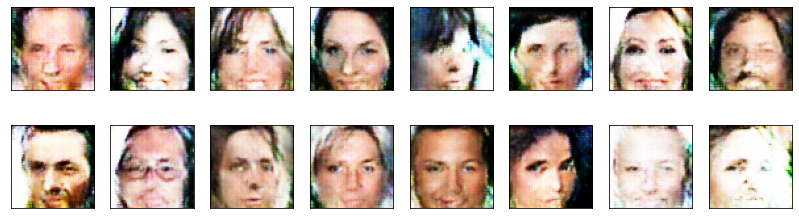

2023-02-12 23:22:06 | Epoch [8/50] | Batch 0/509 | d_loss: -0.0704 | g_loss: 0.7758
2023-02-12 23:22:13 | Epoch [8/50] | Batch 50/509 | d_loss: -0.0817 | g_loss: 0.8119
2023-02-12 23:22:21 | Epoch [8/50] | Batch 100/509 | d_loss: -0.0549 | g_loss: 0.8859
2023-02-12 23:22:29 | Epoch [8/50] | Batch 150/509 | d_loss: -0.0574 | g_loss: 0.9126
2023-02-12 23:22:36 | Epoch [8/50] | Batch 200/509 | d_loss: 0.0003 | g_loss: 0.8258
2023-02-12 23:22:44 | Epoch [8/50] | Batch 250/509 | d_loss: -0.1289 | g_loss: 0.8859
2023-02-12 23:22:52 | Epoch [8/50] | Batch 300/509 | d_loss: -0.0857 | g_loss: 0.8290
2023-02-12 23:23:00 | Epoch [8/50] | Batch 350/509 | d_loss: -0.0611 | g_loss: 0.7218
2023-02-12 23:23:07 | Epoch [8/50] | Batch 400/509 | d_loss: -0.0939 | g_loss: 0.7492
2023-02-12 23:23:15 | Epoch [8/50] | Batch 450/509 | d_loss: -0.0929 | g_loss: 0.8200
2023-02-12 23:23:23 | Epoch [8/50] | Batch 500/509 | d_loss: -0.0610 | g_loss: 0.8277


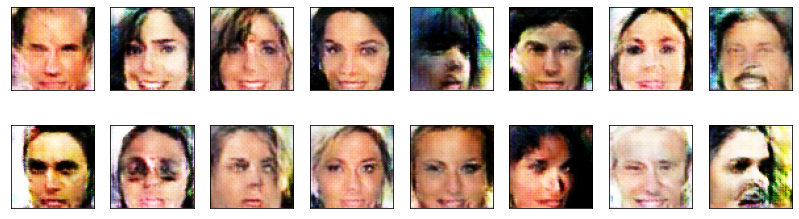

2023-02-12 23:23:25 | Epoch [9/50] | Batch 0/509 | d_loss: -0.0677 | g_loss: 0.8026
2023-02-12 23:23:33 | Epoch [9/50] | Batch 50/509 | d_loss: -0.0673 | g_loss: 0.8208
2023-02-12 23:23:41 | Epoch [9/50] | Batch 100/509 | d_loss: -0.0582 | g_loss: 0.7617
2023-02-12 23:23:48 | Epoch [9/50] | Batch 150/509 | d_loss: -0.1037 | g_loss: 0.8369
2023-02-12 23:23:56 | Epoch [9/50] | Batch 200/509 | d_loss: -0.0132 | g_loss: 0.7895
2023-02-12 23:24:04 | Epoch [9/50] | Batch 250/509 | d_loss: -0.0775 | g_loss: 0.7106
2023-02-12 23:24:11 | Epoch [9/50] | Batch 300/509 | d_loss: -0.0826 | g_loss: 0.7935
2023-02-12 23:24:19 | Epoch [9/50] | Batch 350/509 | d_loss: -0.0835 | g_loss: 0.7853
2023-02-12 23:24:26 | Epoch [9/50] | Batch 400/509 | d_loss: -0.0924 | g_loss: 0.7910
2023-02-12 23:24:34 | Epoch [9/50] | Batch 450/509 | d_loss: -0.0639 | g_loss: 0.8130
2023-02-12 23:24:42 | Epoch [9/50] | Batch 500/509 | d_loss: -0.0763 | g_loss: 0.8098


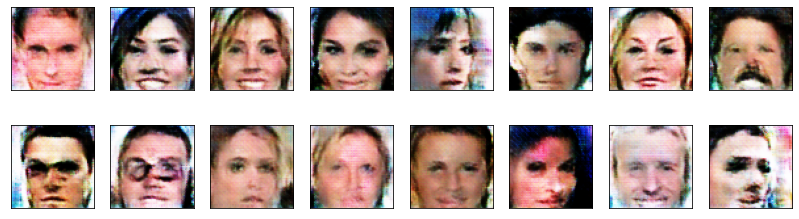

2023-02-12 23:24:44 | Epoch [10/50] | Batch 0/509 | d_loss: -0.0504 | g_loss: 0.7411
2023-02-12 23:24:52 | Epoch [10/50] | Batch 50/509 | d_loss: -0.1254 | g_loss: 0.8369
2023-02-12 23:24:59 | Epoch [10/50] | Batch 100/509 | d_loss: -0.0697 | g_loss: 0.8531
2023-02-12 23:25:07 | Epoch [10/50] | Batch 150/509 | d_loss: -0.0602 | g_loss: 0.9021
2023-02-12 23:25:15 | Epoch [10/50] | Batch 200/509 | d_loss: -0.0954 | g_loss: 0.8611
2023-02-12 23:25:23 | Epoch [10/50] | Batch 250/509 | d_loss: -0.0552 | g_loss: 0.7920
2023-02-12 23:25:30 | Epoch [10/50] | Batch 300/509 | d_loss: -0.0800 | g_loss: 0.8312
2023-02-12 23:25:38 | Epoch [10/50] | Batch 350/509 | d_loss: -0.0994 | g_loss: 0.7552
2023-02-12 23:25:46 | Epoch [10/50] | Batch 400/509 | d_loss: -0.1145 | g_loss: 0.8163
2023-02-12 23:25:54 | Epoch [10/50] | Batch 450/509 | d_loss: -0.1265 | g_loss: 0.8802
2023-02-12 23:26:02 | Epoch [10/50] | Batch 500/509 | d_loss: -0.0981 | g_loss: 0.9459


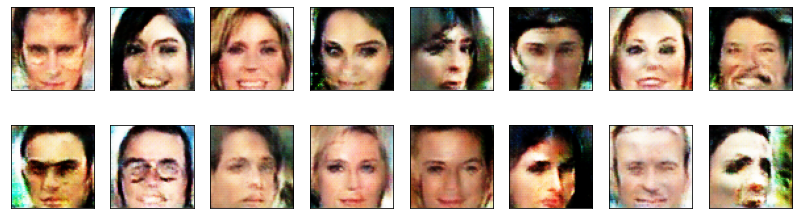

2023-02-12 23:26:04 | Epoch [11/50] | Batch 0/509 | d_loss: -0.0528 | g_loss: 0.8084
2023-02-12 23:26:12 | Epoch [11/50] | Batch 50/509 | d_loss: -0.0991 | g_loss: 0.8621
2023-02-12 23:26:20 | Epoch [11/50] | Batch 100/509 | d_loss: -0.0930 | g_loss: 0.8651
2023-02-12 23:26:27 | Epoch [11/50] | Batch 150/509 | d_loss: -0.0848 | g_loss: 0.8195
2023-02-12 23:26:35 | Epoch [11/50] | Batch 200/509 | d_loss: -0.0514 | g_loss: 0.8169
2023-02-12 23:26:43 | Epoch [11/50] | Batch 250/509 | d_loss: -0.0665 | g_loss: 0.8070
2023-02-12 23:26:51 | Epoch [11/50] | Batch 300/509 | d_loss: -0.0962 | g_loss: 0.8502
2023-02-12 23:26:58 | Epoch [11/50] | Batch 350/509 | d_loss: -0.0731 | g_loss: 0.9042
2023-02-12 23:27:06 | Epoch [11/50] | Batch 400/509 | d_loss: -0.1114 | g_loss: 0.8945
2023-02-12 23:27:14 | Epoch [11/50] | Batch 450/509 | d_loss: -0.0403 | g_loss: 0.8793
2023-02-12 23:27:22 | Epoch [11/50] | Batch 500/509 | d_loss: -0.0758 | g_loss: 0.8799


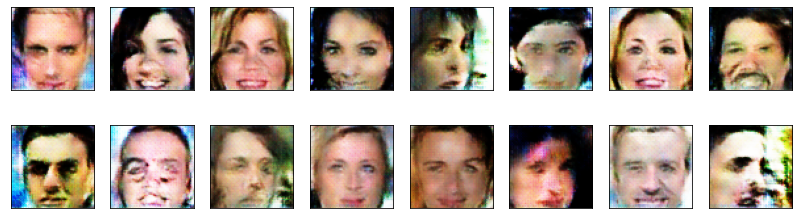

2023-02-12 23:27:24 | Epoch [12/50] | Batch 0/509 | d_loss: -0.0703 | g_loss: 0.8250
2023-02-12 23:27:32 | Epoch [12/50] | Batch 50/509 | d_loss: -0.1325 | g_loss: 0.8626
2023-02-12 23:27:40 | Epoch [12/50] | Batch 100/509 | d_loss: -0.0658 | g_loss: 0.8317
2023-02-12 23:27:48 | Epoch [12/50] | Batch 150/509 | d_loss: -0.0778 | g_loss: 0.8493
2023-02-12 23:27:55 | Epoch [12/50] | Batch 200/509 | d_loss: -0.0795 | g_loss: 0.8606
2023-02-12 23:28:03 | Epoch [12/50] | Batch 250/509 | d_loss: -0.0806 | g_loss: 0.8775
2023-02-12 23:28:11 | Epoch [12/50] | Batch 300/509 | d_loss: -0.0987 | g_loss: 0.8904
2023-02-12 23:28:19 | Epoch [12/50] | Batch 350/509 | d_loss: -0.0608 | g_loss: 0.8511
2023-02-12 23:28:27 | Epoch [12/50] | Batch 400/509 | d_loss: -0.1173 | g_loss: 0.9268
2023-02-12 23:28:35 | Epoch [12/50] | Batch 450/509 | d_loss: -0.0738 | g_loss: 0.8723
2023-02-12 23:28:43 | Epoch [12/50] | Batch 500/509 | d_loss: -0.0993 | g_loss: 0.8021


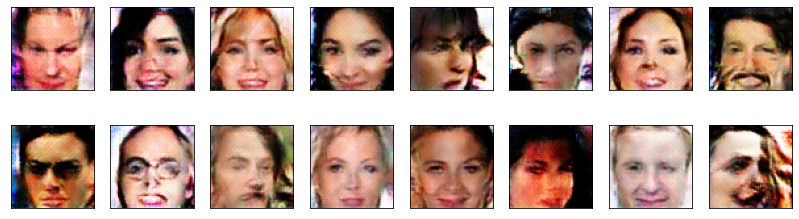

2023-02-12 23:28:45 | Epoch [13/50] | Batch 0/509 | d_loss: -0.0894 | g_loss: 0.8726
2023-02-12 23:28:53 | Epoch [13/50] | Batch 50/509 | d_loss: -0.0823 | g_loss: 0.8812
2023-02-12 23:29:00 | Epoch [13/50] | Batch 100/509 | d_loss: -0.1271 | g_loss: 0.8244
2023-02-12 23:29:08 | Epoch [13/50] | Batch 150/509 | d_loss: -0.0938 | g_loss: 0.7442
2023-02-12 23:29:15 | Epoch [13/50] | Batch 200/509 | d_loss: -0.1371 | g_loss: 0.8814
2023-02-12 23:29:23 | Epoch [13/50] | Batch 250/509 | d_loss: -0.0597 | g_loss: 0.8734
2023-02-12 23:29:31 | Epoch [13/50] | Batch 300/509 | d_loss: -0.1208 | g_loss: 0.8496
2023-02-12 23:29:38 | Epoch [13/50] | Batch 350/509 | d_loss: -0.0966 | g_loss: 0.8620
2023-02-12 23:29:46 | Epoch [13/50] | Batch 400/509 | d_loss: -0.0450 | g_loss: 0.8893
2023-02-12 23:29:54 | Epoch [13/50] | Batch 450/509 | d_loss: -0.1023 | g_loss: 0.8645
2023-02-12 23:30:01 | Epoch [13/50] | Batch 500/509 | d_loss: -0.1537 | g_loss: 0.8487


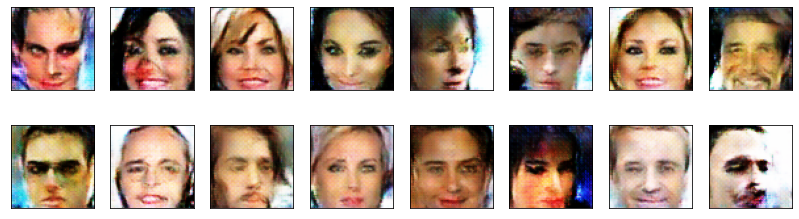

2023-02-12 23:30:03 | Epoch [14/50] | Batch 0/509 | d_loss: -0.0860 | g_loss: 0.9387
2023-02-12 23:30:11 | Epoch [14/50] | Batch 50/509 | d_loss: -0.0668 | g_loss: 0.8801
2023-02-12 23:30:19 | Epoch [14/50] | Batch 100/509 | d_loss: -0.1333 | g_loss: 0.8720
2023-02-12 23:30:27 | Epoch [14/50] | Batch 150/509 | d_loss: -0.0830 | g_loss: 0.9470
2023-02-12 23:30:35 | Epoch [14/50] | Batch 200/509 | d_loss: -0.1145 | g_loss: 0.8745
2023-02-12 23:30:43 | Epoch [14/50] | Batch 250/509 | d_loss: -0.0840 | g_loss: 0.8908
2023-02-12 23:30:51 | Epoch [14/50] | Batch 300/509 | d_loss: -0.0537 | g_loss: 0.8401
2023-02-12 23:30:59 | Epoch [14/50] | Batch 350/509 | d_loss: -0.1041 | g_loss: 0.8807
2023-02-12 23:31:07 | Epoch [14/50] | Batch 400/509 | d_loss: -0.1179 | g_loss: 0.9545
2023-02-12 23:31:14 | Epoch [14/50] | Batch 450/509 | d_loss: -0.0813 | g_loss: 0.9815
2023-02-12 23:31:22 | Epoch [14/50] | Batch 500/509 | d_loss: -0.1391 | g_loss: 0.9033


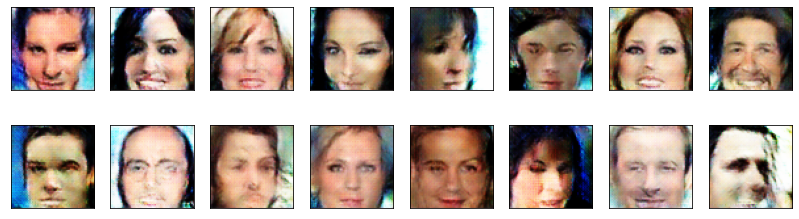

2023-02-12 23:31:25 | Epoch [15/50] | Batch 0/509 | d_loss: -0.1029 | g_loss: 0.9157
2023-02-12 23:31:32 | Epoch [15/50] | Batch 50/509 | d_loss: -0.0729 | g_loss: 0.8857
2023-02-12 23:31:40 | Epoch [15/50] | Batch 100/509 | d_loss: -0.1191 | g_loss: 0.9400
2023-02-12 23:31:48 | Epoch [15/50] | Batch 150/509 | d_loss: -0.0983 | g_loss: 0.9921
2023-02-12 23:31:55 | Epoch [15/50] | Batch 200/509 | d_loss: -0.0706 | g_loss: 0.8684
2023-02-12 23:32:03 | Epoch [15/50] | Batch 250/509 | d_loss: -0.1110 | g_loss: 0.9577
2023-02-12 23:32:11 | Epoch [15/50] | Batch 300/509 | d_loss: -0.0951 | g_loss: 1.0076
2023-02-12 23:32:18 | Epoch [15/50] | Batch 350/509 | d_loss: -0.1249 | g_loss: 0.9935
2023-02-12 23:32:26 | Epoch [15/50] | Batch 400/509 | d_loss: -0.0521 | g_loss: 0.9761
2023-02-12 23:32:33 | Epoch [15/50] | Batch 450/509 | d_loss: -0.1324 | g_loss: 0.9055
2023-02-12 23:32:41 | Epoch [15/50] | Batch 500/509 | d_loss: -0.1011 | g_loss: 1.0662


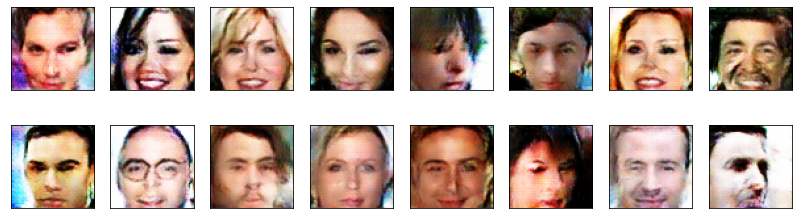

2023-02-12 23:32:43 | Epoch [16/50] | Batch 0/509 | d_loss: -0.1037 | g_loss: 1.0646
2023-02-12 23:32:51 | Epoch [16/50] | Batch 50/509 | d_loss: -0.1393 | g_loss: 1.0106
2023-02-12 23:32:58 | Epoch [16/50] | Batch 100/509 | d_loss: -0.1118 | g_loss: 1.0549
2023-02-12 23:33:06 | Epoch [16/50] | Batch 150/509 | d_loss: -0.1433 | g_loss: 1.0461
2023-02-12 23:33:13 | Epoch [16/50] | Batch 200/509 | d_loss: -0.1452 | g_loss: 1.0454
2023-02-12 23:33:21 | Epoch [16/50] | Batch 250/509 | d_loss: -0.0949 | g_loss: 1.0292
2023-02-12 23:33:29 | Epoch [16/50] | Batch 300/509 | d_loss: -0.0428 | g_loss: 0.9744
2023-02-12 23:33:36 | Epoch [16/50] | Batch 350/509 | d_loss: -0.0763 | g_loss: 1.0159
2023-02-12 23:33:44 | Epoch [16/50] | Batch 400/509 | d_loss: -0.1052 | g_loss: 0.9446
2023-02-12 23:33:51 | Epoch [16/50] | Batch 450/509 | d_loss: -0.1366 | g_loss: 1.1309
2023-02-12 23:33:59 | Epoch [16/50] | Batch 500/509 | d_loss: -0.0794 | g_loss: 1.0220


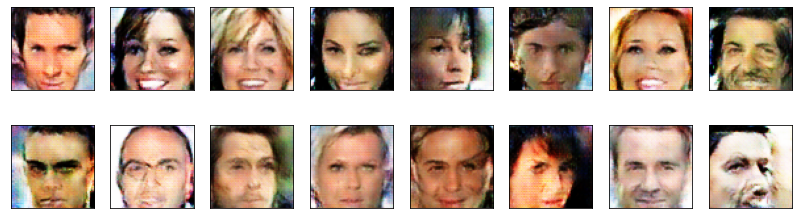

2023-02-12 23:34:01 | Epoch [17/50] | Batch 0/509 | d_loss: -0.0948 | g_loss: 1.0244
2023-02-12 23:34:09 | Epoch [17/50] | Batch 50/509 | d_loss: -0.1345 | g_loss: 0.9970
2023-02-12 23:34:17 | Epoch [17/50] | Batch 100/509 | d_loss: -0.0717 | g_loss: 1.0253
2023-02-12 23:34:24 | Epoch [17/50] | Batch 150/509 | d_loss: -0.0770 | g_loss: 1.0327
2023-02-12 23:34:32 | Epoch [17/50] | Batch 200/509 | d_loss: -0.1003 | g_loss: 0.9999
2023-02-12 23:34:40 | Epoch [17/50] | Batch 250/509 | d_loss: -0.1109 | g_loss: 0.9194
2023-02-12 23:34:48 | Epoch [17/50] | Batch 300/509 | d_loss: -0.1067 | g_loss: 0.9738
2023-02-12 23:34:55 | Epoch [17/50] | Batch 350/509 | d_loss: -0.1226 | g_loss: 0.8618
2023-02-12 23:35:03 | Epoch [17/50] | Batch 400/509 | d_loss: -0.1065 | g_loss: 0.8794
2023-02-12 23:35:11 | Epoch [17/50] | Batch 450/509 | d_loss: -0.0847 | g_loss: 0.9378
2023-02-12 23:35:19 | Epoch [17/50] | Batch 500/509 | d_loss: -0.0990 | g_loss: 0.9344


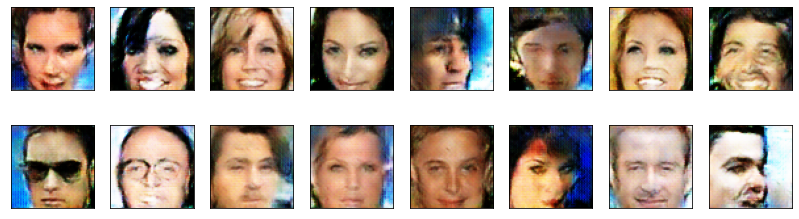

2023-02-12 23:35:21 | Epoch [18/50] | Batch 0/509 | d_loss: -0.1437 | g_loss: 0.9244
2023-02-12 23:35:28 | Epoch [18/50] | Batch 50/509 | d_loss: -0.0943 | g_loss: 0.8167
2023-02-12 23:35:36 | Epoch [18/50] | Batch 100/509 | d_loss: -0.1280 | g_loss: 0.8589
2023-02-12 23:35:44 | Epoch [18/50] | Batch 150/509 | d_loss: -0.1762 | g_loss: 0.9682
2023-02-12 23:35:51 | Epoch [18/50] | Batch 200/509 | d_loss: -0.1552 | g_loss: 0.8748
2023-02-12 23:35:59 | Epoch [18/50] | Batch 250/509 | d_loss: -0.0843 | g_loss: 0.9261
2023-02-12 23:36:07 | Epoch [18/50] | Batch 300/509 | d_loss: -0.1160 | g_loss: 0.9300
2023-02-12 23:36:14 | Epoch [18/50] | Batch 350/509 | d_loss: -0.0765 | g_loss: 0.8637
2023-02-12 23:36:22 | Epoch [18/50] | Batch 400/509 | d_loss: -0.1594 | g_loss: 0.9076
2023-02-12 23:36:29 | Epoch [18/50] | Batch 450/509 | d_loss: -0.0919 | g_loss: 0.9351
2023-02-12 23:36:37 | Epoch [18/50] | Batch 500/509 | d_loss: -0.1477 | g_loss: 0.9698


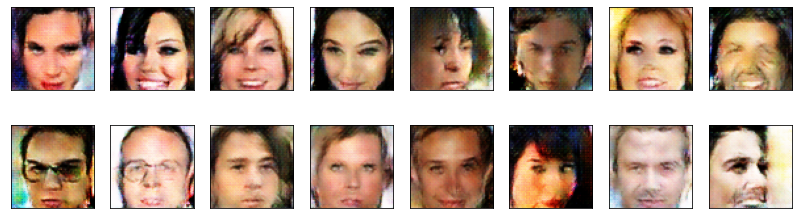

2023-02-12 23:36:39 | Epoch [19/50] | Batch 0/509 | d_loss: -0.0776 | g_loss: 0.8624
2023-02-12 23:36:47 | Epoch [19/50] | Batch 50/509 | d_loss: -0.0968 | g_loss: 0.9503
2023-02-12 23:36:55 | Epoch [19/50] | Batch 100/509 | d_loss: -0.1344 | g_loss: 0.9693
2023-02-12 23:37:02 | Epoch [19/50] | Batch 150/509 | d_loss: -0.1341 | g_loss: 0.9510
2023-02-12 23:37:10 | Epoch [19/50] | Batch 200/509 | d_loss: -0.1480 | g_loss: 0.9787
2023-02-12 23:37:18 | Epoch [19/50] | Batch 250/509 | d_loss: -0.1443 | g_loss: 0.9734
2023-02-12 23:37:25 | Epoch [19/50] | Batch 300/509 | d_loss: -0.1325 | g_loss: 1.0057
2023-02-12 23:37:33 | Epoch [19/50] | Batch 350/509 | d_loss: -0.1097 | g_loss: 1.0243
2023-02-12 23:37:41 | Epoch [19/50] | Batch 400/509 | d_loss: -0.1445 | g_loss: 1.0143
2023-02-12 23:37:49 | Epoch [19/50] | Batch 450/509 | d_loss: -0.1529 | g_loss: 0.9064
2023-02-12 23:37:56 | Epoch [19/50] | Batch 500/509 | d_loss: -0.1210 | g_loss: 0.8832


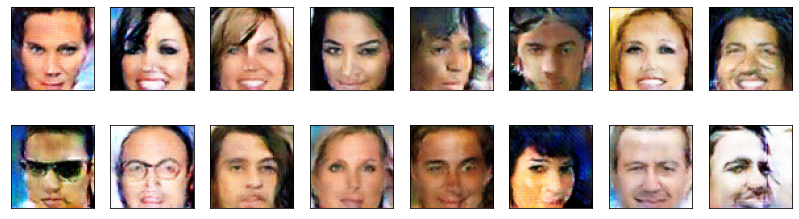

2023-02-12 23:37:58 | Epoch [20/50] | Batch 0/509 | d_loss: -0.1045 | g_loss: 0.9689
2023-02-12 23:38:06 | Epoch [20/50] | Batch 50/509 | d_loss: -0.1484 | g_loss: 1.0229
2023-02-12 23:38:14 | Epoch [20/50] | Batch 100/509 | d_loss: -0.1695 | g_loss: 0.8133
2023-02-12 23:38:21 | Epoch [20/50] | Batch 150/509 | d_loss: -0.1569 | g_loss: 0.7769
2023-02-12 23:38:29 | Epoch [20/50] | Batch 200/509 | d_loss: -0.0750 | g_loss: 0.8776
2023-02-12 23:38:36 | Epoch [20/50] | Batch 250/509 | d_loss: -0.1168 | g_loss: 0.9076
2023-02-12 23:38:44 | Epoch [20/50] | Batch 300/509 | d_loss: -0.1149 | g_loss: 0.9181
2023-02-12 23:38:52 | Epoch [20/50] | Batch 350/509 | d_loss: -0.1357 | g_loss: 0.9503
2023-02-12 23:38:59 | Epoch [20/50] | Batch 400/509 | d_loss: -0.1687 | g_loss: 0.9418
2023-02-12 23:39:07 | Epoch [20/50] | Batch 450/509 | d_loss: -0.1343 | g_loss: 0.9259
2023-02-12 23:39:15 | Epoch [20/50] | Batch 500/509 | d_loss: -0.1500 | g_loss: 0.8833


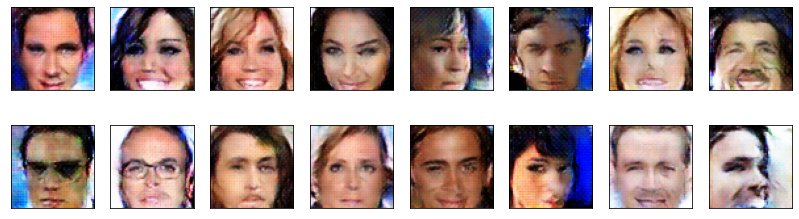

2023-02-12 23:39:17 | Epoch [21/50] | Batch 0/509 | d_loss: -0.1591 | g_loss: 0.8526
2023-02-12 23:39:25 | Epoch [21/50] | Batch 50/509 | d_loss: -0.1403 | g_loss: 0.8826
2023-02-12 23:39:32 | Epoch [21/50] | Batch 100/509 | d_loss: -0.1134 | g_loss: 0.9590
2023-02-12 23:39:40 | Epoch [21/50] | Batch 150/509 | d_loss: -0.1489 | g_loss: 0.8160
2023-02-12 23:39:48 | Epoch [21/50] | Batch 200/509 | d_loss: -0.1294 | g_loss: 0.8569
2023-02-12 23:39:55 | Epoch [21/50] | Batch 250/509 | d_loss: -0.1822 | g_loss: 0.9304
2023-02-12 23:40:03 | Epoch [21/50] | Batch 300/509 | d_loss: -0.1424 | g_loss: 0.8639
2023-02-12 23:40:11 | Epoch [21/50] | Batch 350/509 | d_loss: -0.1488 | g_loss: 0.9368
2023-02-12 23:40:18 | Epoch [21/50] | Batch 400/509 | d_loss: -0.1317 | g_loss: 0.8779
2023-02-12 23:40:26 | Epoch [21/50] | Batch 450/509 | d_loss: -0.1532 | g_loss: 0.9794
2023-02-12 23:40:34 | Epoch [21/50] | Batch 500/509 | d_loss: -0.1477 | g_loss: 0.8762


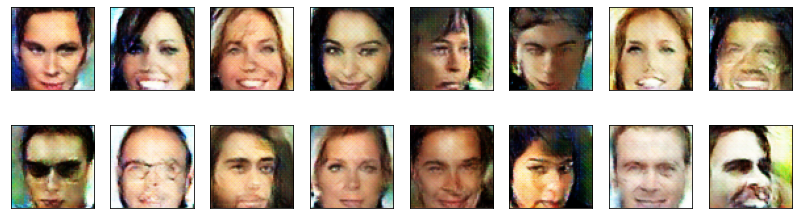

2023-02-12 23:40:36 | Epoch [22/50] | Batch 0/509 | d_loss: -0.0919 | g_loss: 0.8922
2023-02-12 23:40:43 | Epoch [22/50] | Batch 50/509 | d_loss: -0.0992 | g_loss: 0.8854
2023-02-12 23:40:51 | Epoch [22/50] | Batch 100/509 | d_loss: -0.1521 | g_loss: 0.9146
2023-02-12 23:40:59 | Epoch [22/50] | Batch 150/509 | d_loss: -0.1083 | g_loss: 0.9245
2023-02-12 23:41:06 | Epoch [22/50] | Batch 200/509 | d_loss: -0.1184 | g_loss: 0.9275
2023-02-12 23:41:14 | Epoch [22/50] | Batch 250/509 | d_loss: -0.1719 | g_loss: 0.8553
2023-02-12 23:41:22 | Epoch [22/50] | Batch 300/509 | d_loss: -0.1128 | g_loss: 0.8044
2023-02-12 23:41:29 | Epoch [22/50] | Batch 350/509 | d_loss: -0.1346 | g_loss: 0.8045
2023-02-12 23:41:37 | Epoch [22/50] | Batch 400/509 | d_loss: -0.1550 | g_loss: 0.7383
2023-02-12 23:41:45 | Epoch [22/50] | Batch 450/509 | d_loss: -0.1204 | g_loss: 0.8235
2023-02-12 23:41:52 | Epoch [22/50] | Batch 500/509 | d_loss: -0.1819 | g_loss: 0.8827


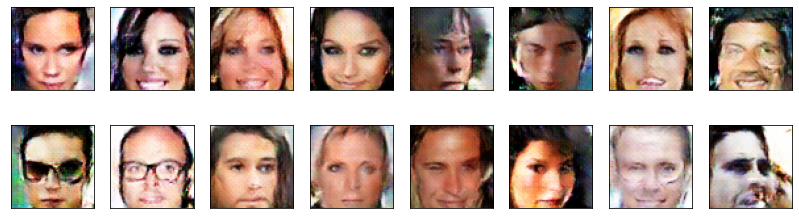

2023-02-12 23:41:55 | Epoch [23/50] | Batch 0/509 | d_loss: -0.1415 | g_loss: 0.7872
2023-02-12 23:42:02 | Epoch [23/50] | Batch 50/509 | d_loss: -0.1446 | g_loss: 0.7899
2023-02-12 23:42:10 | Epoch [23/50] | Batch 100/509 | d_loss: -0.1378 | g_loss: 0.7459
2023-02-12 23:42:18 | Epoch [23/50] | Batch 150/509 | d_loss: -0.1094 | g_loss: 0.8404
2023-02-12 23:42:26 | Epoch [23/50] | Batch 200/509 | d_loss: -0.1294 | g_loss: 0.7119
2023-02-12 23:42:34 | Epoch [23/50] | Batch 250/509 | d_loss: -0.1122 | g_loss: 0.3603
2023-02-12 23:42:41 | Epoch [23/50] | Batch 300/509 | d_loss: -0.1658 | g_loss: -0.9701
2023-02-12 23:42:49 | Epoch [23/50] | Batch 350/509 | d_loss: -0.0931 | g_loss: -0.9043
2023-02-12 23:42:56 | Epoch [23/50] | Batch 400/509 | d_loss: -0.0340 | g_loss: -1.2610
2023-02-12 23:43:04 | Epoch [23/50] | Batch 450/509 | d_loss: -0.1243 | g_loss: -1.0861
2023-02-12 23:43:12 | Epoch [23/50] | Batch 500/509 | d_loss: -0.0572 | g_loss: -1.5327


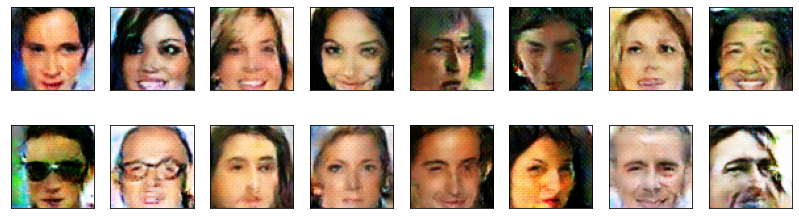

2023-02-12 23:43:14 | Epoch [24/50] | Batch 0/509 | d_loss: -0.1450 | g_loss: -1.3112
2023-02-12 23:43:22 | Epoch [24/50] | Batch 50/509 | d_loss: -0.1463 | g_loss: -1.2751
2023-02-12 23:43:30 | Epoch [24/50] | Batch 100/509 | d_loss: -0.0948 | g_loss: -1.2805
2023-02-12 23:43:38 | Epoch [24/50] | Batch 150/509 | d_loss: -0.1136 | g_loss: -1.3425
2023-02-12 23:43:45 | Epoch [24/50] | Batch 200/509 | d_loss: -0.1237 | g_loss: -1.4548
2023-02-12 23:43:53 | Epoch [24/50] | Batch 250/509 | d_loss: -0.1061 | g_loss: -1.1589
2023-02-12 23:44:01 | Epoch [24/50] | Batch 300/509 | d_loss: -0.0924 | g_loss: -1.2922
2023-02-12 23:44:09 | Epoch [24/50] | Batch 350/509 | d_loss: -0.1510 | g_loss: -1.6076
2023-02-12 23:44:16 | Epoch [24/50] | Batch 400/509 | d_loss: -0.1598 | g_loss: -1.3780
2023-02-12 23:44:24 | Epoch [24/50] | Batch 450/509 | d_loss: -0.1118 | g_loss: -1.3639
2023-02-12 23:44:32 | Epoch [24/50] | Batch 500/509 | d_loss: -0.1194 | g_loss: -1.2907


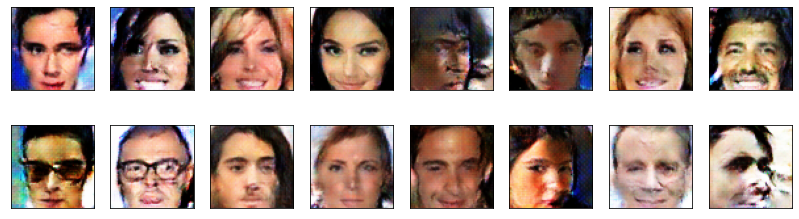

2023-02-12 23:44:34 | Epoch [25/50] | Batch 0/509 | d_loss: -0.2150 | g_loss: -1.3832
2023-02-12 23:44:41 | Epoch [25/50] | Batch 50/509 | d_loss: -0.1079 | g_loss: -1.2304
2023-02-12 23:44:49 | Epoch [25/50] | Batch 100/509 | d_loss: -0.1774 | g_loss: -1.3217
2023-02-12 23:44:57 | Epoch [25/50] | Batch 150/509 | d_loss: -0.1460 | g_loss: -1.4070
2023-02-12 23:45:04 | Epoch [25/50] | Batch 200/509 | d_loss: -0.2013 | g_loss: -1.5401
2023-02-12 23:45:12 | Epoch [25/50] | Batch 250/509 | d_loss: -0.1402 | g_loss: -1.5325
2023-02-12 23:45:20 | Epoch [25/50] | Batch 300/509 | d_loss: -0.1602 | g_loss: -1.5702
2023-02-12 23:45:27 | Epoch [25/50] | Batch 350/509 | d_loss: -0.2019 | g_loss: -1.3245
2023-02-12 23:45:35 | Epoch [25/50] | Batch 400/509 | d_loss: -0.1386 | g_loss: -1.5644
2023-02-12 23:45:42 | Epoch [25/50] | Batch 450/509 | d_loss: -0.1517 | g_loss: -1.4533
2023-02-12 23:45:50 | Epoch [25/50] | Batch 500/509 | d_loss: -0.1474 | g_loss: -1.3548


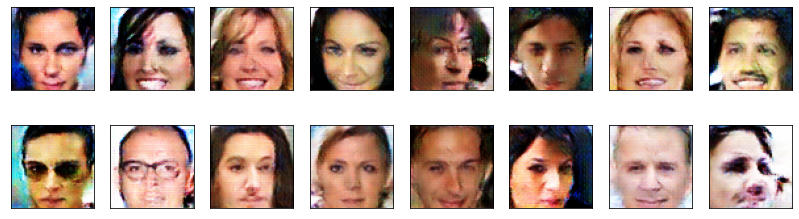

2023-02-12 23:45:52 | Epoch [26/50] | Batch 0/509 | d_loss: -0.1779 | g_loss: -1.6156
2023-02-12 23:46:00 | Epoch [26/50] | Batch 50/509 | d_loss: -0.1687 | g_loss: -1.5248
2023-02-12 23:46:07 | Epoch [26/50] | Batch 100/509 | d_loss: -0.1705 | g_loss: -1.4711
2023-02-12 23:46:15 | Epoch [26/50] | Batch 150/509 | d_loss: -0.1675 | g_loss: -1.4196
2023-02-12 23:46:23 | Epoch [26/50] | Batch 200/509 | d_loss: -0.1486 | g_loss: -1.4825
2023-02-12 23:46:30 | Epoch [26/50] | Batch 250/509 | d_loss: -0.1570 | g_loss: -1.5221
2023-02-12 23:46:38 | Epoch [26/50] | Batch 300/509 | d_loss: -0.1735 | g_loss: -1.4057
2023-02-12 23:46:45 | Epoch [26/50] | Batch 350/509 | d_loss: -0.1553 | g_loss: -1.6656
2023-02-12 23:46:53 | Epoch [26/50] | Batch 400/509 | d_loss: -0.1511 | g_loss: -1.6477
2023-02-12 23:47:01 | Epoch [26/50] | Batch 450/509 | d_loss: -0.2152 | g_loss: -1.4347
2023-02-12 23:47:09 | Epoch [26/50] | Batch 500/509 | d_loss: -0.1788 | g_loss: -1.3546


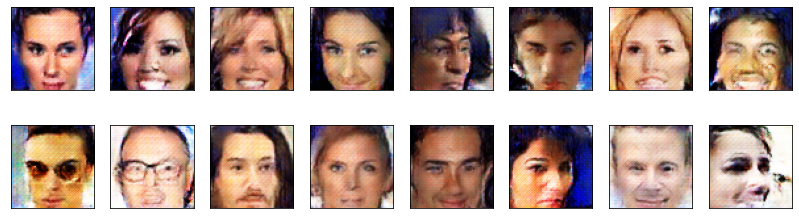

2023-02-12 23:47:11 | Epoch [27/50] | Batch 0/509 | d_loss: -0.1862 | g_loss: -1.5861
2023-02-12 23:47:18 | Epoch [27/50] | Batch 50/509 | d_loss: -0.1556 | g_loss: -1.5580
2023-02-12 23:47:26 | Epoch [27/50] | Batch 100/509 | d_loss: -0.0987 | g_loss: -1.8537
2023-02-12 23:47:34 | Epoch [27/50] | Batch 150/509 | d_loss: -0.1782 | g_loss: -1.6956
2023-02-12 23:47:41 | Epoch [27/50] | Batch 200/509 | d_loss: -0.0911 | g_loss: -1.6817
2023-02-12 23:47:49 | Epoch [27/50] | Batch 250/509 | d_loss: -0.1620 | g_loss: -1.8493
2023-02-12 23:47:56 | Epoch [27/50] | Batch 300/509 | d_loss: -0.1482 | g_loss: -1.7157
2023-02-12 23:48:04 | Epoch [27/50] | Batch 350/509 | d_loss: -0.1787 | g_loss: -1.8204
2023-02-12 23:48:12 | Epoch [27/50] | Batch 400/509 | d_loss: -0.1096 | g_loss: -1.8372
2023-02-12 23:48:19 | Epoch [27/50] | Batch 450/509 | d_loss: -0.1772 | g_loss: -1.7179
2023-02-12 23:48:27 | Epoch [27/50] | Batch 500/509 | d_loss: -0.1702 | g_loss: -1.6992


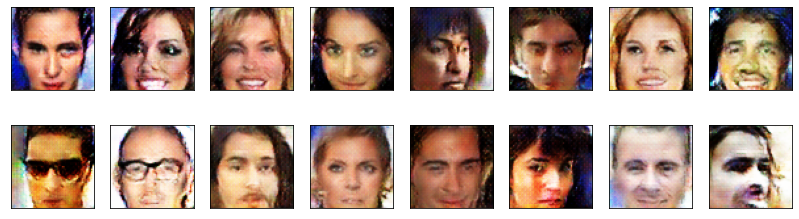

2023-02-12 23:48:29 | Epoch [28/50] | Batch 0/509 | d_loss: -0.1936 | g_loss: -1.7335
2023-02-12 23:48:37 | Epoch [28/50] | Batch 50/509 | d_loss: -0.1858 | g_loss: -1.4399
2023-02-12 23:48:44 | Epoch [28/50] | Batch 100/509 | d_loss: -0.1625 | g_loss: -1.7586
2023-02-12 23:48:52 | Epoch [28/50] | Batch 150/509 | d_loss: -0.1467 | g_loss: -1.6088
2023-02-12 23:49:00 | Epoch [28/50] | Batch 200/509 | d_loss: -0.1411 | g_loss: -1.7103
2023-02-12 23:49:08 | Epoch [28/50] | Batch 250/509 | d_loss: -0.1377 | g_loss: -1.7167
2023-02-12 23:49:15 | Epoch [28/50] | Batch 300/509 | d_loss: -0.1397 | g_loss: -1.7941
2023-02-12 23:49:23 | Epoch [28/50] | Batch 350/509 | d_loss: -0.1323 | g_loss: -1.6289
2023-02-12 23:49:30 | Epoch [28/50] | Batch 400/509 | d_loss: -0.1304 | g_loss: -1.7212
2023-02-12 23:49:38 | Epoch [28/50] | Batch 450/509 | d_loss: -0.1519 | g_loss: -1.7044
2023-02-12 23:49:45 | Epoch [28/50] | Batch 500/509 | d_loss: -0.1575 | g_loss: -1.7314


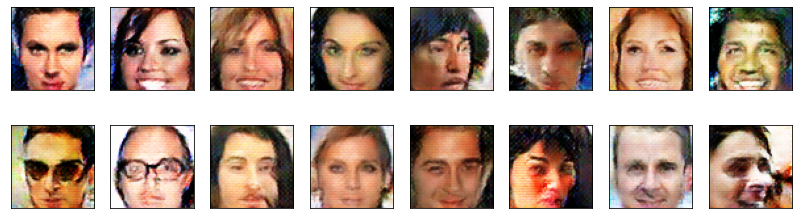

2023-02-12 23:49:48 | Epoch [29/50] | Batch 0/509 | d_loss: -0.2139 | g_loss: -1.7046
2023-02-12 23:49:55 | Epoch [29/50] | Batch 50/509 | d_loss: -0.2351 | g_loss: -1.5847
2023-02-12 23:50:03 | Epoch [29/50] | Batch 100/509 | d_loss: -0.2371 | g_loss: -1.7064
2023-02-12 23:50:11 | Epoch [29/50] | Batch 150/509 | d_loss: -0.1882 | g_loss: -1.5990
2023-02-12 23:50:18 | Epoch [29/50] | Batch 200/509 | d_loss: -0.1433 | g_loss: -1.5775
2023-02-12 23:50:26 | Epoch [29/50] | Batch 250/509 | d_loss: -0.2362 | g_loss: -1.6257
2023-02-12 23:50:34 | Epoch [29/50] | Batch 300/509 | d_loss: -0.1691 | g_loss: -1.6057
2023-02-12 23:50:41 | Epoch [29/50] | Batch 350/509 | d_loss: -0.2112 | g_loss: -1.5108
2023-02-12 23:50:49 | Epoch [29/50] | Batch 400/509 | d_loss: -0.1708 | g_loss: -1.7630
2023-02-12 23:50:57 | Epoch [29/50] | Batch 450/509 | d_loss: -0.1811 | g_loss: -1.7767
2023-02-12 23:51:04 | Epoch [29/50] | Batch 500/509 | d_loss: -0.1854 | g_loss: -1.6298


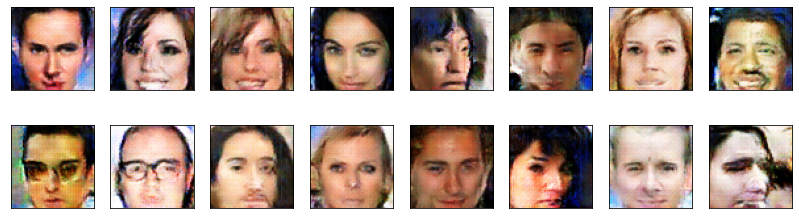

2023-02-12 23:51:06 | Epoch [30/50] | Batch 0/509 | d_loss: -0.2036 | g_loss: -1.5707
2023-02-12 23:51:14 | Epoch [30/50] | Batch 50/509 | d_loss: -0.1703 | g_loss: -1.7034
2023-02-12 23:51:22 | Epoch [30/50] | Batch 100/509 | d_loss: -0.1545 | g_loss: -1.6511
2023-02-12 23:51:30 | Epoch [30/50] | Batch 150/509 | d_loss: -0.1831 | g_loss: -1.8267
2023-02-12 23:51:37 | Epoch [30/50] | Batch 200/509 | d_loss: -0.2083 | g_loss: -1.9330
2023-02-12 23:51:45 | Epoch [30/50] | Batch 250/509 | d_loss: -0.1900 | g_loss: -1.8751
2023-02-12 23:51:52 | Epoch [30/50] | Batch 300/509 | d_loss: -0.2446 | g_loss: -1.9270
2023-02-12 23:52:00 | Epoch [30/50] | Batch 350/509 | d_loss: -0.2155 | g_loss: -2.0842
2023-02-12 23:52:07 | Epoch [30/50] | Batch 400/509 | d_loss: -0.1868 | g_loss: -1.8024
2023-02-12 23:52:15 | Epoch [30/50] | Batch 450/509 | d_loss: -0.1487 | g_loss: -1.8018
2023-02-12 23:52:23 | Epoch [30/50] | Batch 500/509 | d_loss: -0.1397 | g_loss: -1.9087


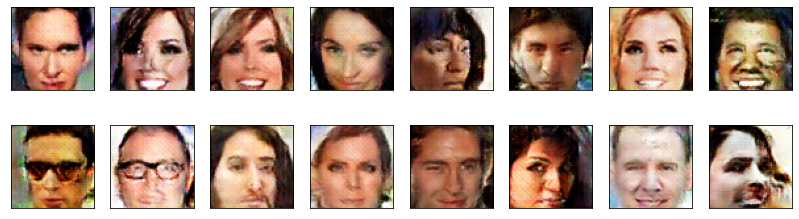

2023-02-12 23:52:25 | Epoch [31/50] | Batch 0/509 | d_loss: -0.1790 | g_loss: -1.7684
2023-02-12 23:52:32 | Epoch [31/50] | Batch 50/509 | d_loss: -0.2436 | g_loss: -1.9407
2023-02-12 23:52:40 | Epoch [31/50] | Batch 100/509 | d_loss: -0.2213 | g_loss: -1.9262
2023-02-12 23:52:48 | Epoch [31/50] | Batch 150/509 | d_loss: -0.2341 | g_loss: -2.0895
2023-02-12 23:52:55 | Epoch [31/50] | Batch 200/509 | d_loss: -0.1341 | g_loss: -2.1000
2023-02-12 23:53:03 | Epoch [31/50] | Batch 250/509 | d_loss: -0.1631 | g_loss: -2.0159
2023-02-12 23:53:10 | Epoch [31/50] | Batch 300/509 | d_loss: -0.2405 | g_loss: -1.9337
2023-02-12 23:53:18 | Epoch [31/50] | Batch 350/509 | d_loss: -0.1198 | g_loss: -2.1251
2023-02-12 23:53:26 | Epoch [31/50] | Batch 400/509 | d_loss: -0.1792 | g_loss: -1.9853
2023-02-12 23:53:33 | Epoch [31/50] | Batch 450/509 | d_loss: -0.2020 | g_loss: -1.9371
2023-02-12 23:53:41 | Epoch [31/50] | Batch 500/509 | d_loss: -0.2311 | g_loss: -1.9462


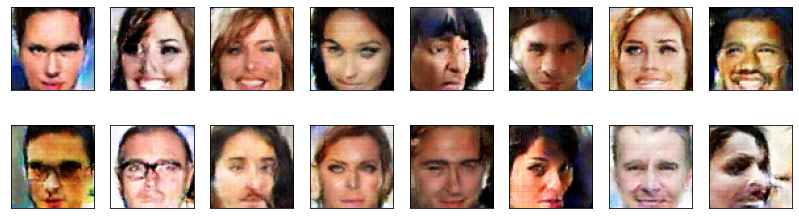

2023-02-12 23:53:43 | Epoch [32/50] | Batch 0/509 | d_loss: -0.1722 | g_loss: -1.7684
2023-02-12 23:53:51 | Epoch [32/50] | Batch 50/509 | d_loss: -0.2302 | g_loss: -2.0332
2023-02-12 23:53:59 | Epoch [32/50] | Batch 100/509 | d_loss: -0.2174 | g_loss: -1.8611
2023-02-12 23:54:06 | Epoch [32/50] | Batch 150/509 | d_loss: -0.1506 | g_loss: -1.8326
2023-02-12 23:54:14 | Epoch [32/50] | Batch 200/509 | d_loss: -0.2568 | g_loss: -1.9579
2023-02-12 23:54:22 | Epoch [32/50] | Batch 250/509 | d_loss: -0.1879 | g_loss: -1.9177
2023-02-12 23:54:30 | Epoch [32/50] | Batch 300/509 | d_loss: -0.1701 | g_loss: -1.8454
2023-02-12 23:54:37 | Epoch [32/50] | Batch 350/509 | d_loss: -0.1584 | g_loss: -1.9580
2023-02-12 23:54:45 | Epoch [32/50] | Batch 400/509 | d_loss: -0.1514 | g_loss: -1.6574
2023-02-12 23:54:53 | Epoch [32/50] | Batch 450/509 | d_loss: -0.1949 | g_loss: -1.8293
2023-02-12 23:55:01 | Epoch [32/50] | Batch 500/509 | d_loss: -0.1690 | g_loss: -1.8644


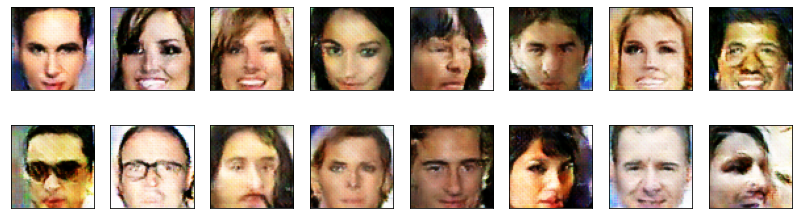

2023-02-12 23:55:03 | Epoch [33/50] | Batch 0/509 | d_loss: -0.1727 | g_loss: -1.7164
2023-02-12 23:55:11 | Epoch [33/50] | Batch 50/509 | d_loss: -0.1602 | g_loss: -1.8770
2023-02-12 23:55:18 | Epoch [33/50] | Batch 100/509 | d_loss: -0.3019 | g_loss: -1.6882
2023-02-12 23:55:26 | Epoch [33/50] | Batch 150/509 | d_loss: -0.1715 | g_loss: -2.0328
2023-02-12 23:55:33 | Epoch [33/50] | Batch 200/509 | d_loss: -0.1901 | g_loss: -1.8292
2023-02-12 23:55:41 | Epoch [33/50] | Batch 250/509 | d_loss: -0.1925 | g_loss: -2.0057
2023-02-12 23:55:48 | Epoch [33/50] | Batch 300/509 | d_loss: -0.2230 | g_loss: -1.9688
2023-02-12 23:55:56 | Epoch [33/50] | Batch 350/509 | d_loss: -0.1655 | g_loss: -1.8671
2023-02-12 23:56:04 | Epoch [33/50] | Batch 400/509 | d_loss: -0.1752 | g_loss: -1.8973
2023-02-12 23:56:12 | Epoch [33/50] | Batch 450/509 | d_loss: -0.2010 | g_loss: -2.0233
2023-02-12 23:56:20 | Epoch [33/50] | Batch 500/509 | d_loss: -0.1581 | g_loss: -1.8456


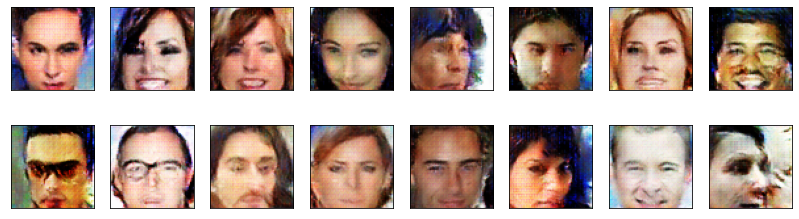

2023-02-12 23:56:22 | Epoch [34/50] | Batch 0/509 | d_loss: -0.2061 | g_loss: -1.8929
2023-02-12 23:56:29 | Epoch [34/50] | Batch 50/509 | d_loss: -0.2257 | g_loss: -1.8846
2023-02-12 23:56:37 | Epoch [34/50] | Batch 100/509 | d_loss: -0.1940 | g_loss: -2.0592
2023-02-12 23:56:44 | Epoch [34/50] | Batch 150/509 | d_loss: -0.2031 | g_loss: -2.0787
2023-02-12 23:56:52 | Epoch [34/50] | Batch 200/509 | d_loss: -0.1584 | g_loss: -1.9412
2023-02-12 23:57:00 | Epoch [34/50] | Batch 250/509 | d_loss: -0.2181 | g_loss: -1.6639
2023-02-12 23:57:07 | Epoch [34/50] | Batch 300/509 | d_loss: -0.1635 | g_loss: -1.6681
2023-02-12 23:57:15 | Epoch [34/50] | Batch 350/509 | d_loss: -0.2195 | g_loss: -1.6850
2023-02-12 23:57:23 | Epoch [34/50] | Batch 400/509 | d_loss: -0.2128 | g_loss: -1.8304
2023-02-12 23:57:31 | Epoch [34/50] | Batch 450/509 | d_loss: -0.2175 | g_loss: -1.8268
2023-02-12 23:57:39 | Epoch [34/50] | Batch 500/509 | d_loss: -0.1636 | g_loss: -1.7616


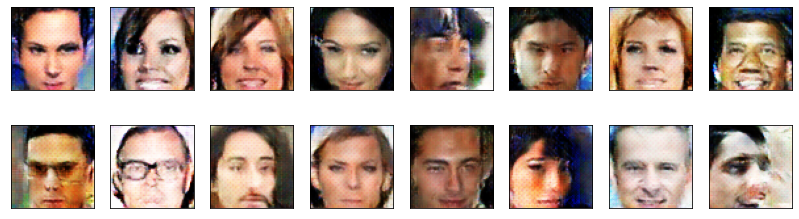

2023-02-12 23:57:41 | Epoch [35/50] | Batch 0/509 | d_loss: -0.1957 | g_loss: -1.8654
2023-02-12 23:57:48 | Epoch [35/50] | Batch 50/509 | d_loss: -0.2407 | g_loss: -2.1025
2023-02-12 23:57:56 | Epoch [35/50] | Batch 100/509 | d_loss: -0.1943 | g_loss: -1.9051
2023-02-12 23:58:03 | Epoch [35/50] | Batch 150/509 | d_loss: -0.2360 | g_loss: -1.9521
2023-02-12 23:58:11 | Epoch [35/50] | Batch 200/509 | d_loss: -0.1589 | g_loss: -2.0747
2023-02-12 23:58:19 | Epoch [35/50] | Batch 250/509 | d_loss: -0.1827 | g_loss: -2.0050
2023-02-12 23:58:26 | Epoch [35/50] | Batch 300/509 | d_loss: -0.2181 | g_loss: -1.7820
2023-02-12 23:58:34 | Epoch [35/50] | Batch 350/509 | d_loss: -0.1841 | g_loss: -1.8256
2023-02-12 23:58:42 | Epoch [35/50] | Batch 400/509 | d_loss: -0.2425 | g_loss: -1.8890
2023-02-12 23:58:49 | Epoch [35/50] | Batch 450/509 | d_loss: -0.1600 | g_loss: -1.9994
2023-02-12 23:58:57 | Epoch [35/50] | Batch 500/509 | d_loss: -0.1769 | g_loss: -2.0520


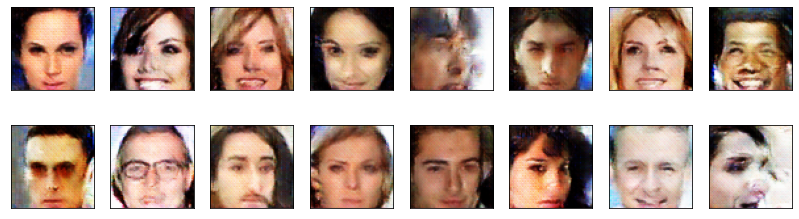

2023-02-12 23:58:59 | Epoch [36/50] | Batch 0/509 | d_loss: -0.2085 | g_loss: -1.9970
2023-02-12 23:59:07 | Epoch [36/50] | Batch 50/509 | d_loss: -0.2115 | g_loss: -1.8940
2023-02-12 23:59:14 | Epoch [36/50] | Batch 100/509 | d_loss: -0.2470 | g_loss: -2.1770
2023-02-12 23:59:22 | Epoch [36/50] | Batch 150/509 | d_loss: -0.2355 | g_loss: -2.0775
2023-02-12 23:59:30 | Epoch [36/50] | Batch 200/509 | d_loss: -0.2512 | g_loss: -2.1470
2023-02-12 23:59:37 | Epoch [36/50] | Batch 250/509 | d_loss: -0.1815 | g_loss: -2.0074
2023-02-12 23:59:45 | Epoch [36/50] | Batch 300/509 | d_loss: -0.1807 | g_loss: -1.9093
2023-02-12 23:59:52 | Epoch [36/50] | Batch 350/509 | d_loss: -0.1757 | g_loss: -1.9872
2023-02-13 00:00:00 | Epoch [36/50] | Batch 400/509 | d_loss: -0.2275 | g_loss: -2.0350
2023-02-13 00:00:08 | Epoch [36/50] | Batch 450/509 | d_loss: -0.2490 | g_loss: -2.0814
2023-02-13 00:00:15 | Epoch [36/50] | Batch 500/509 | d_loss: -0.2259 | g_loss: -1.9758


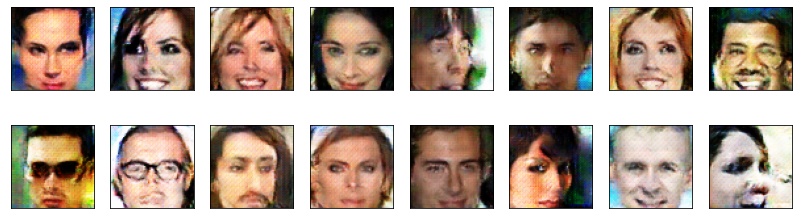

2023-02-13 00:00:17 | Epoch [37/50] | Batch 0/509 | d_loss: -0.2201 | g_loss: -1.9894
2023-02-13 00:00:25 | Epoch [37/50] | Batch 50/509 | d_loss: -0.1917 | g_loss: -1.9160
2023-02-13 00:00:33 | Epoch [37/50] | Batch 100/509 | d_loss: -0.2302 | g_loss: -2.0364
2023-02-13 00:00:41 | Epoch [37/50] | Batch 150/509 | d_loss: -0.2123 | g_loss: -1.9321
2023-02-13 00:00:48 | Epoch [37/50] | Batch 200/509 | d_loss: -0.1878 | g_loss: -2.0239
2023-02-13 00:00:56 | Epoch [37/50] | Batch 250/509 | d_loss: -0.1994 | g_loss: -1.9187
2023-02-13 00:01:03 | Epoch [37/50] | Batch 300/509 | d_loss: -0.2263 | g_loss: -1.9187
2023-02-13 00:01:11 | Epoch [37/50] | Batch 350/509 | d_loss: -0.1948 | g_loss: -2.0909
2023-02-13 00:01:18 | Epoch [37/50] | Batch 400/509 | d_loss: -0.2156 | g_loss: -1.9752
2023-02-13 00:01:26 | Epoch [37/50] | Batch 450/509 | d_loss: -0.2763 | g_loss: -1.9093
2023-02-13 00:01:34 | Epoch [37/50] | Batch 500/509 | d_loss: -0.2831 | g_loss: -1.8425


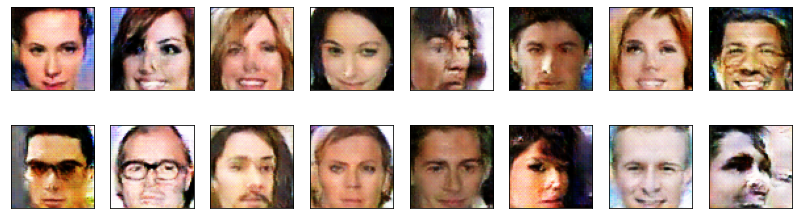

2023-02-13 00:01:36 | Epoch [38/50] | Batch 0/509 | d_loss: -0.2511 | g_loss: -1.8637
2023-02-13 00:01:43 | Epoch [38/50] | Batch 50/509 | d_loss: -0.2388 | g_loss: -1.7892
2023-02-13 00:01:51 | Epoch [38/50] | Batch 100/509 | d_loss: -0.2218 | g_loss: -1.9954
2023-02-13 00:01:58 | Epoch [38/50] | Batch 150/509 | d_loss: -0.1892 | g_loss: -2.0995
2023-02-13 00:02:06 | Epoch [38/50] | Batch 200/509 | d_loss: -0.1802 | g_loss: -1.8960
2023-02-13 00:02:14 | Epoch [38/50] | Batch 250/509 | d_loss: -0.1780 | g_loss: -1.9257
2023-02-13 00:02:22 | Epoch [38/50] | Batch 300/509 | d_loss: -0.1970 | g_loss: -1.8330
2023-02-13 00:02:30 | Epoch [38/50] | Batch 350/509 | d_loss: -0.2060 | g_loss: -1.9031
2023-02-13 00:02:39 | Epoch [38/50] | Batch 400/509 | d_loss: -0.2397 | g_loss: -2.0333
2023-02-13 00:02:48 | Epoch [38/50] | Batch 450/509 | d_loss: -0.2280 | g_loss: -2.0506
2023-02-13 00:02:56 | Epoch [38/50] | Batch 500/509 | d_loss: -0.2216 | g_loss: -2.0380


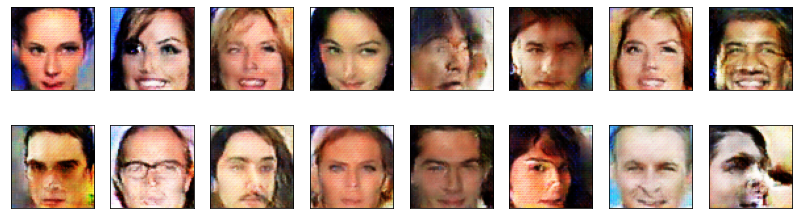

2023-02-13 00:02:59 | Epoch [39/50] | Batch 0/509 | d_loss: -0.2402 | g_loss: -1.9157
2023-02-13 00:03:07 | Epoch [39/50] | Batch 50/509 | d_loss: -0.2047 | g_loss: -2.0278
2023-02-13 00:03:14 | Epoch [39/50] | Batch 100/509 | d_loss: -0.2520 | g_loss: -1.9495
2023-02-13 00:03:22 | Epoch [39/50] | Batch 150/509 | d_loss: -0.2140 | g_loss: -1.9426
2023-02-13 00:03:30 | Epoch [39/50] | Batch 200/509 | d_loss: -0.2311 | g_loss: -2.0609
2023-02-13 00:03:38 | Epoch [39/50] | Batch 250/509 | d_loss: -0.2363 | g_loss: -1.9677


KeyboardInterrupt: 

In [ ]:
writer = SummaryWriter(f"runs/WDRAGAN_{datetime.now():%Y-%m-%d_%H-%M-%S}", 
                      comment=f"with Wasserstein loss, train generator 5 times more")

fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().to(device)

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy
        
        ####################################
        
        # ============================================
        #          TRAIN THE DISCRIMINATOR
        # ============================================

        for _ in range(1):
            # noise = torch.ones(real_images.shape)
            # noise = noise.view(-1)
            # noisy_portion = noise.size()[0] // 100
            # noisy_idx = np.random.choice(list(range(noise.size()[0])), noisy_portion)
            # random_pool = 2 * np.random.rand(noisy_portion) - 1
            # for i in range(noisy_portion):
            #     noise[noisy_idx[i]] = random_pool[i]
            # noise = noise.view(real_images.shape).cuda()
            # noisy_real_images = real_images * noise
            
            d_loss = discriminator_step(discriminator, d_optimizer, batch_size, latent_dim, real_images)

        # =========================================
        #            TRAIN THE GENERATOR
        # =========================================

        for _ in range(1):
            g_loss = generator_step(generator, discriminator, g_optimizer, batch_size, latent_dim)

        # =========================================
        #          LOGGING AND VISUALIZATION
        # =========================================
                
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))

            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
            writer.add_scalar('d_loss', d, epoch * len(dataloader) + batch_i)
            writer.add_scalar('g_loss', g, epoch * len(dataloader) + batch_i)

            # save fid score
            generated_images = generator(fixed_latent_vector)
            fid = calculate_fid(real_images, generated_images)
            writer.add_scalar('fid', fid, epoch * len(dataloader) + batch_i)

    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)

    # save image for tensorboard
    grid = torchvision.utils.make_grid(torch.from_numpy(denormalize(generated_images.detach().cpu().numpy())))
    writer.add_image('images', grid, epoch)

    generator.train()

writer.close()

### Training losses

Plot the training losses for the generator and discriminator.

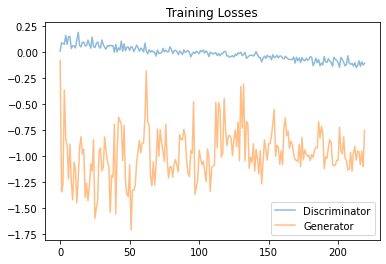

In [ ]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)



### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.